## Final anndata object of Thomas Conlon's smoking project

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
from matplotlib import rcParams

# verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.verbosity = 3               
sc.logging.print_version_and_date()

# custom functions
import ma_codes as codes
from ma_codes import mysize, mymap, gray_red

Running Scanpy 1.6.1.dev110+gb4234d81, on 2021-03-03 12:43.


In [2]:
## path variable
adata_path = '/mnt/platte_1/Projects/200217_SmokedMice_all/200426_Smoked_Mice_allcells_noMixture.h5ad'

In [3]:
## plotting parameters
sc.settings.figdir = '/home/agando/Documents/Niklas/Projects/macrophages_smoking_THOMAS/Figures/'
sc.set_figure_params(vector_friendly = True)
plt.rcParams['figure.figsize'] = (6, 5)
plt.rcParams['pdf.fonttype'] = 42

In [4]:
## load data
adata = sc.read(adata_path)

In [5]:
## explore meta data of adata object
adata

AnnData object with n_obs × n_vars = 68269 × 27780
    obs: 'air', 'condition', 'identifier', 'name', 'timepoint', 'n_counts', 'n_genes', 'percent.mito', 'QC_group', 'size_factors', 'S_score', 'G2M_score', 'phase', 'louvain_1', 'louvain', 'louvain_2', 'cell_type', 'cell_type_condition', 'louvain_3', 'cell_type_nano', 'meta_cell_type', 'cell_type_refined'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'n_counts'
    uns: 'cell_type_colors', 'cell_type_nano_colors', 'cell_type_refined_colors', 'condition_colors', 'dendrogram_louvain_2', 'louvain', 'louvain_1_colors', 'louvain_2_colors', 'louvain_3_colors', 'neighbors', 'pca', 'rank_genes_groups', 'timepoint_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

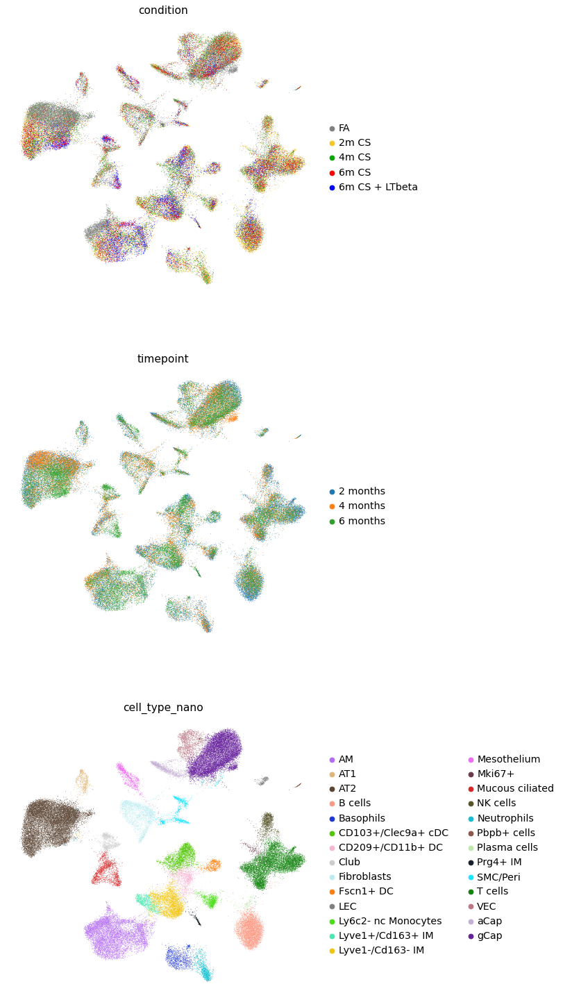

In [6]:
## plot UMAP
rcParams['figure.figsize'] = 7, 7
sc.pl.umap(adata, color = ['condition', 'timepoint','cell_type_nano'],
           ncols = 1, frameon = False)

### Add meta immune cell type labels

In [7]:
## define labels
DC_cluster = ['CD103+/Clec9a+ cDC', 'CD209+/CD11b+ DC', 'Fscn1+ DC']
macrophage_cluster = ['AM', 'Lyve1+/Cd163+ IM', 'Lyve1-/Cd163- IM', 'Prg4+ IM', 'Ly6c2- nc Monocytes']

In [8]:
adata.obs['meta_cell_type'] = ['Macrophages' if ct in macrophage_cluster else ct for ct in adata.obs['cell_type_nano']]
adata.obs['meta_cell_type'] = ['DCs' if ct in DC_cluster else ct for ct in adata.obs['meta_cell_type']]
adata.obs['meta_cell_type'] = adata.obs['meta_cell_type'].astype('category')
## check results
adata.obs['meta_cell_type'].value_counts()

AT2                13808
Macrophages        12948
gCap               10421
T cells             7780
B cells             4670
DCs                 4203
Fibroblasts         2435
Mucous ciliated     1599
VEC                 1486
aCap                1253
NK cells            1129
Neutrophils         1110
SMC/Peri            1083
Basophils           1076
Mesothelium         1020
Club                 910
AT1                  619
LEC                  267
Mki67+               224
Plasma cells         157
Pbpb+ cells           71
Name: meta_cell_type, dtype: int64

### Subset Mononuclear Phagocytes (Monocytes, Macrophages and DCs)

In [9]:
adata_MP = adata[adata.obs['meta_cell_type'].isin(['Macrophages', 'DCs'])].copy()
adata_MP

AnnData object with n_obs × n_vars = 17151 × 27780
    obs: 'air', 'condition', 'identifier', 'name', 'timepoint', 'n_counts', 'n_genes', 'percent.mito', 'QC_group', 'size_factors', 'S_score', 'G2M_score', 'phase', 'louvain_1', 'louvain', 'louvain_2', 'cell_type', 'cell_type_condition', 'louvain_3', 'cell_type_nano', 'meta_cell_type', 'cell_type_refined'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'n_counts'
    uns: 'cell_type_colors', 'cell_type_nano_colors', 'cell_type_refined_colors', 'condition_colors', 'dendrogram_louvain_2', 'louvain', 'louvain_1_colors', 'louvain_2_colors', 'louvain_3_colors', 'neighbors', 'pca', 'rank_genes_groups', 'timepoint_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

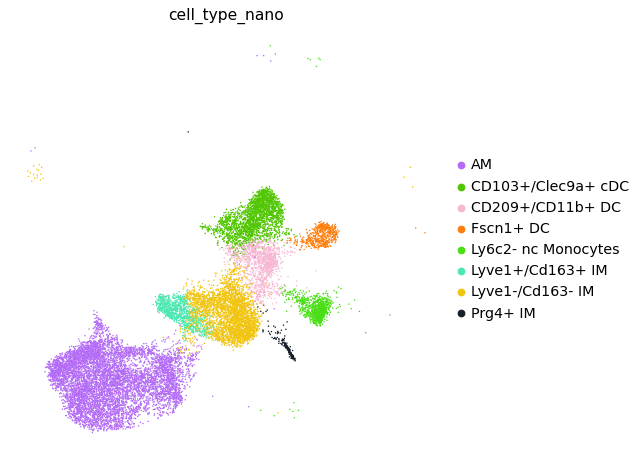

In [10]:
sc.pl.umap(adata_MP, color = ['cell_type_nano'], frameon = False)

In [11]:
## remove outliers based on density clustering
adata_MP = adata[adata.obs['meta_cell_type'].isin(['Macrophages', 'DCs'])].copy()
adata_MP.obs['dcluster'] = codes.tidy_up(adata_MP.obsm['X_umap'], min_samples = 200)
adata_MP = adata_MP[adata_MP.obs.dcluster.isin(["0"])].copy()
adata_MP

AnnData object with n_obs × n_vars = 17104 × 27780
    obs: 'air', 'condition', 'identifier', 'name', 'timepoint', 'n_counts', 'n_genes', 'percent.mito', 'QC_group', 'size_factors', 'S_score', 'G2M_score', 'phase', 'louvain_1', 'louvain', 'louvain_2', 'cell_type', 'cell_type_condition', 'louvain_3', 'cell_type_nano', 'meta_cell_type', 'cell_type_refined', 'dcluster'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'n_counts'
    uns: 'cell_type_colors', 'cell_type_nano_colors', 'cell_type_refined_colors', 'condition_colors', 'dendrogram_louvain_2', 'louvain', 'louvain_1_colors', 'louvain_2_colors', 'louvain_3_colors', 'neighbors', 'pca', 'rank_genes_groups', 'timepoint_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

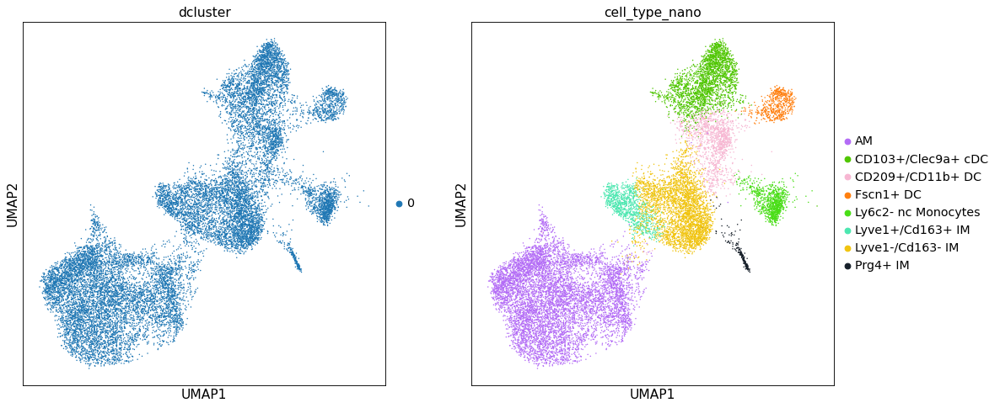

In [12]:
sc.pl.umap(adata_MP, color = ['dcluster', 'cell_type_nano'])

### Re-calculate HVGs

In [14]:
## filter genes
sc.pp.filter_genes(adata_MP, min_cells = 5)
sc.pp.filter_genes(adata_MP, min_counts = 1)

filtered out 866 genes that are detected in less than 5 cells
filtered out 18521 genes that are detected in less than 1 counts


extracting highly variable genes
/home/agando/Documents/Meshal/python_packages/scanpy/scanpy/preprocessing/_highly_variable_genes.py:208: RuntimeWarning: invalid value encountered in log
  dispersion = np.log(dispersion)
/home/agando/Documents/Meshal/python_packages/scanpy/scanpy/preprocessing/_highly_variable_genes.py:208: RuntimeWarning: invalid value encountered in log
  dispersion = np.log(dispersion)
/home/agando/Documents/Meshal/python_packages/scanpy/scanpy/preprocessing/_highly_variable_genes.py:208: RuntimeWarning: invalid value encountered in log
  dispersion = np.log(dispersion)
/home/agando/Documents/Meshal/python_packages/scanpy/scanpy/preprocessing/_highly_variable_genes.py:208: RuntimeWarning: invalid value encountered in log
  dispersion = np.log(dispersion)
/home/agando/Documents/Meshal/python_packages/scanpy/scanpy/preprocessing/_highly_variable_genes.py:208: RuntimeWarning: invalid value encountered in log
  dispersion = np.log(dispersion)
/home/agando/Documents/Mesh

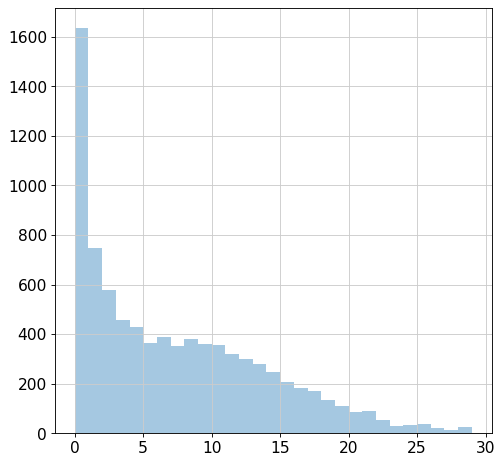

In [15]:
## compute HVGs of each sample
batch = "identifier" # sample name is stored und adata.obs['identifier']
sc.pp.highly_variable_genes(adata_MP, min_disp = None, max_disp = None, min_mean = None, max_mean = None, 
                                batch_key = batch, n_top_genes = 2000, n_bins = 20, flavor="seurat", 
                                subset = False)
vartab = pd.DataFrame(adata_MP.var["highly_variable_nbatches"], index = adata.var_names)
sb.distplot(vartab, kde = False, bins = len(np.unique(adata.obs[batch])))

In [16]:
## only keep genes variable in at least five samples
thresh = 5
hvgs = vartab[vartab.highly_variable_nbatches.values >= thresh].index
print("%s Genes kept, variable in at least %s samples" %(len(hvgs), thresh))

4547 Genes kept, variable in at least 5 samples


In [17]:
## set HVGs 
adata_MP.var["highly_variable"] = [g in hvgs for g in adata_MP.var_names]

### Re-run PCA


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:07)


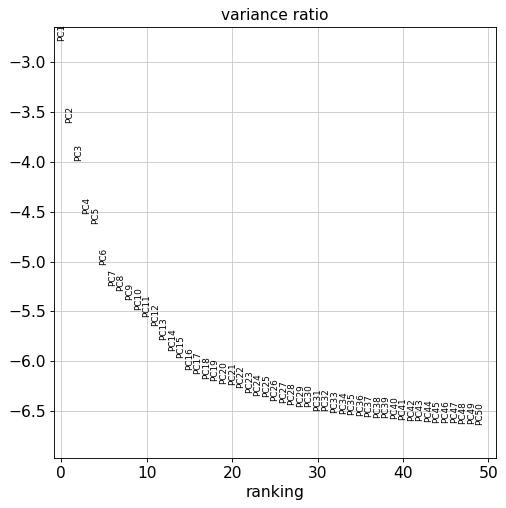

In [18]:
sc.pp.pca(adata_MP, use_highly_variable = True)
sc.pl.pca_variance_ratio(adata_MP, n_pcs = 50, log = True)

### Graph-based clustering

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:12)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 18 clusters and added
    'sub_louvain', the cluster labels (adata.obs, categorical) (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:14)


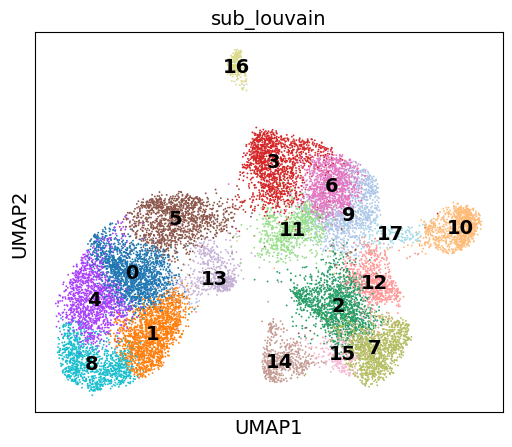

In [19]:
## construct kNN graph
sc.pp.neighbors(adata_MP, n_pcs = 50, n_neighbors = 20)
## louvain clustering
sc.tl.louvain(adata_MP, resolution = 2.0, key_added = "sub_louvain")
## calculate UMAP representation
sc.tl.umap(adata_MP)
## plot UMAP embedding
sc.pl.umap(adata_MP, color = ["sub_louvain"], ax = mysize(6, 5, 100), legend_loc = "on data")

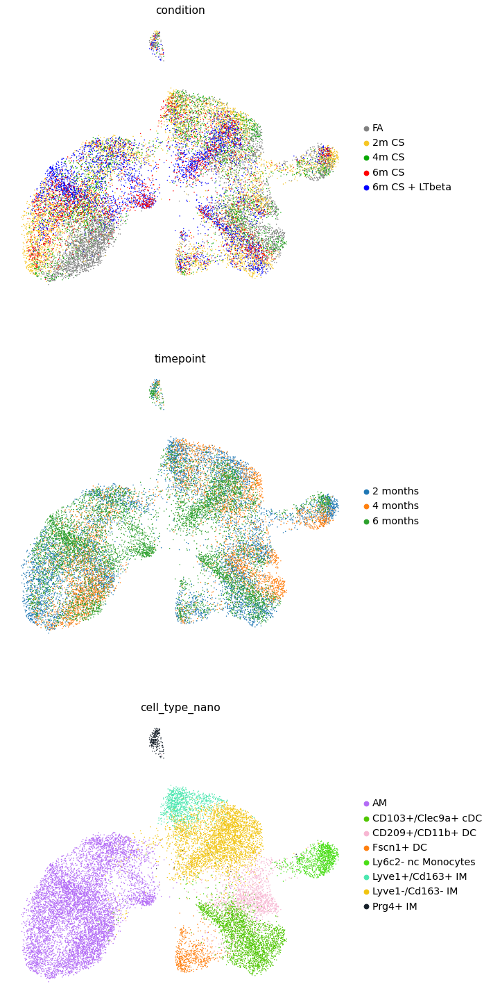

In [20]:
sc.pl.umap(adata_MP, color = ['condition', 'timepoint','cell_type_nano'], frameon = False, ncols = 1, wspace = 0.25)

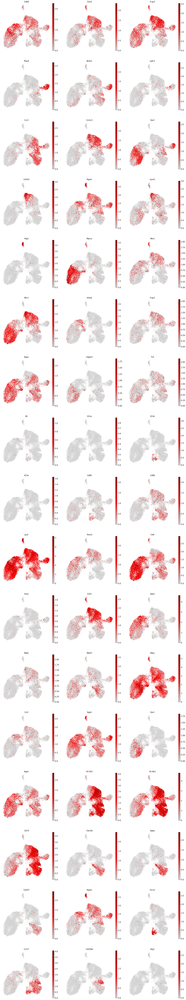

In [21]:
sc.pl.umap(adata_MP, color = ['Cd68', #Monocyte/Macrophage lineage marker
                              'Cd14', 'Fcgr3', 'Plac8', 'Nr4a1', # monocytes
                              'Ly6c2', "Ccr2", # classical monocytes
                              'Cx3cr1', "Ear2", # non-classical monocytes
                              'Cd163', 'Itgam', 'Lyve1', 'Prg4', # interstitial Macrophages
                              'Marco', 'Msr1', 'Mrc1', 'Inhba', 'Fcgr1', 'Itgax', 'Siglecf', # AM
                              'Tnf', 'Il6', 'Il12a', 'Il12b', 'Il23a', 'Cd80', 'Cd86', 'Lyz2', # inflammatory Macrophages
                              'Trem2', 'Cd9', 'Vcan', 'Csf1r', 'Spp1', 'Matk', # inflammatory Macrophages
                              'Mki67', # proliferation
                              'Sftpc', # AT2
                              'Ccl2', 'Itgb2', 'Ear1',
                              'Itgax', 'H2-Eb1', 'H2-Ab1', 'Cd74', #DCs
                              'Clec9a', 'Itgae', 'Cd207', # CD103+ DCs
                              'Itgam', # CD11b+ cDCs
                              'Fscn1', # Fscn1+ DCs
                              'Ccl17', 'Cd209a',
                              'Arg1'], 
           ncols = 3, cmap = gray_red, frameon = False, size = 25)

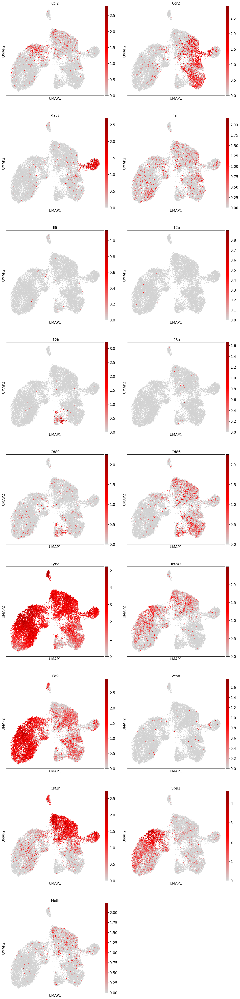

In [22]:
## inflammatory (Monocyte-derived) Macrophage signature
sc.pl.umap(adata_MP, color = ['Ccl2', 'Ccr2', 'Plac8', 'Tnf', 'Il6', 'Il12a', 
                              'Il12b', 'Il23a', 'Cd80', 'Cd86', 'Lyz2',
                              'Trem2',  'Cd9', 'Vcan', 'Csf1r', 'Spp1', 'Matk'], 
           cmap = gray_red, ncols = 2, size = 25)

In [23]:
## subset to AM cluster only
adata_AM = adata_MP[adata_MP.obs.sub_louvain.isin(['0','1','4','8','5','13'])].copy()

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_sub_louvain']`
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:09)


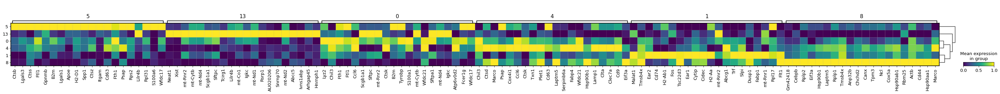

In [24]:
## find markers distinguishing the Inhba+ clusters '5' and '13' from AMs
sc.tl.dendrogram(adata_AM, groupby = 'sub_louvain')
sc.tl.rank_genes_groups(adata_AM, groupby = "sub_louvain", groups = ['0','1','4','8','5','13'], method = "wilcoxon")
sc.pl.rank_genes_groups_matrixplot(adata_AM, n_genes = 20, groups = ['0','1','4','8','5','13'], standard_scale = "var")

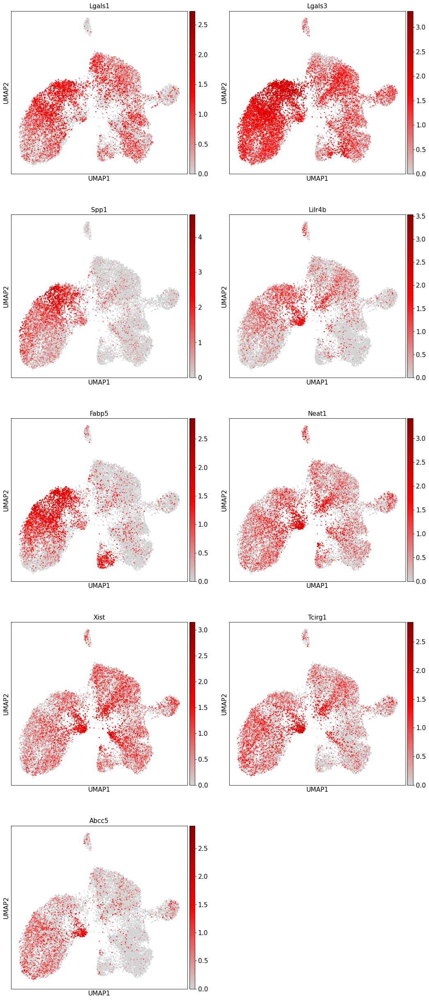

In [25]:
## plot some potential markers onto the UMAPs
sc.pl.umap(adata_MP, color = ['Lgals1', 'Lgals3', 'Spp1', 'Lilr4b', 'Fabp5', 'Neat1', 'Xist', 'Tcirg1','Abcc5'], ncols = 2, size =25, cmap= gray_red)

### Cell type Annotation

... storing 'cell_type' as categorical


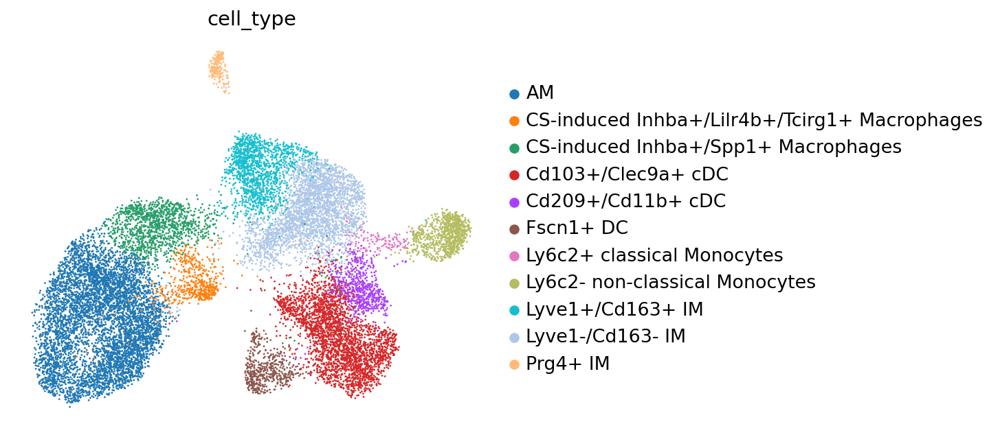

In [26]:
# dict() with louvain clusters as keys, and cell types as entries
cell_type = {'0': 'AM',
             '1': 'AM',
             '2': 'Cd103+/Clec9a+ cDC',
             '3': 'Lyve1+/Cd163+ IM',
             '4': 'AM',
             '5': 'CS-induced Inhba+/Spp1+ Macrophages',
             '6': 'Lyve1-/Cd163- IM',
             '7': 'Cd103+/Clec9a+ cDC',
             '8': 'AM',
             '9': 'Lyve1-/Cd163- IM',
             '10': 'Ly6c2- non-classical Monocytes',
             '11': 'Lyve1-/Cd163- IM',
             '12': 'Cd209+/Cd11b+ cDC',
             '13': 'CS-induced Inhba+/Lilr4b+/Tcirg1+ Macrophages',
             '14': 'Fscn1+ DC',
             '15': 'Cd103+/Clec9a+ cDC',
             '16': 'Prg4+ IM',
             '17': 'Ly6c2+ classical Monocytes'}

adata_MP.obs["cell_type"] = [cell_type[cluster] for cluster in adata_MP.obs["sub_louvain"]]
sc.pl.umap(adata_MP, color = "cell_type", ax = mysize(6, 5, 150), frameon = False)

### Calculate Marker genes

In [27]:
## All Markers
sc.tl.rank_genes_groups(adata_MP, groupby = 'cell_type', n_genes = 500, groups = "all",
                        use_raw = True, method = "wilcoxon")

## Combine into one Data Frame (comparable to Marker Table)
result = adata_MP.uns['rank_genes_groups']
allMarkers = []
for cluster in result['names'].dtype.names:
    current = pd.DataFrame({"gene": result["names"][cluster], "score": result["scores"][cluster],
                            "logfoldchange": result["logfoldchanges"][cluster], "pval": result["pvals"][cluster],
                            "pval_adj": result["pvals_adj"][cluster], "cluster": cluster})
    allMarkers.append(current)
allMarkers = pd.concat(allMarkers)
allMarkers.head()

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:22)


,gene,score,logfoldchange,pval,pval_adj,cluster
0,Chil3,97.699684,5.094601,0.0,0.0,AM
1,Ctsd,83.777641,3.178650,0.0,0.0,AM
2,Ccl6,82.312340,3.053805,0.0,0.0,AM
3,Cd9,69.439941,2.381696,0.0,0.0,AM
4,Plet1,67.427177,3.952033,0.0,0.0,AM


In [28]:
## filter
allMarkers = allMarkers[allMarkers.pval_adj < 0.1].copy()
allMarkers.cluster.value_counts()

Ly6c2- non-classical Monocytes                   500
Cd103+/Clec9a+ cDC                               500
Lyve1+/Cd163+ IM                                 500
Fscn1+ DC                                        500
AM                                               500
Lyve1-/Cd163- IM                                 500
Cd209+/Cd11b+ cDC                                500
CS-induced Inhba+/Spp1+ Macrophages              500
Ly6c2+ classical Monocytes                       402
Prg4+ IM                                         266
CS-induced Inhba+/Lilr4b+/Tcirg1+ Macrophages    259
Name: cluster, dtype: int64

In [29]:
## save
out_folder = "/home/agando/Documents/Niklas/Projects/macrophages_smoking_THOMAS/Data/"
allMarkers.to_csv(out_folder + "MNP_AllMarkers.csv", sep = "\t", index = False)

### Visualization

In [30]:
adata_MP.obs.cell_type.cat.categories

Index(['AM', 'CS-induced Inhba+/Lilr4b+/Tcirg1+ Macrophages',
       'CS-induced Inhba+/Spp1+ Macrophages', 'Cd103+/Clec9a+ cDC',
       'Cd209+/Cd11b+ cDC', 'Fscn1+ DC', 'Ly6c2+ classical Monocytes',
       'Ly6c2- non-classical Monocytes', 'Lyve1+/Cd163+ IM',
       'Lyve1-/Cd163- IM', 'Prg4+ IM'],
      dtype='object')

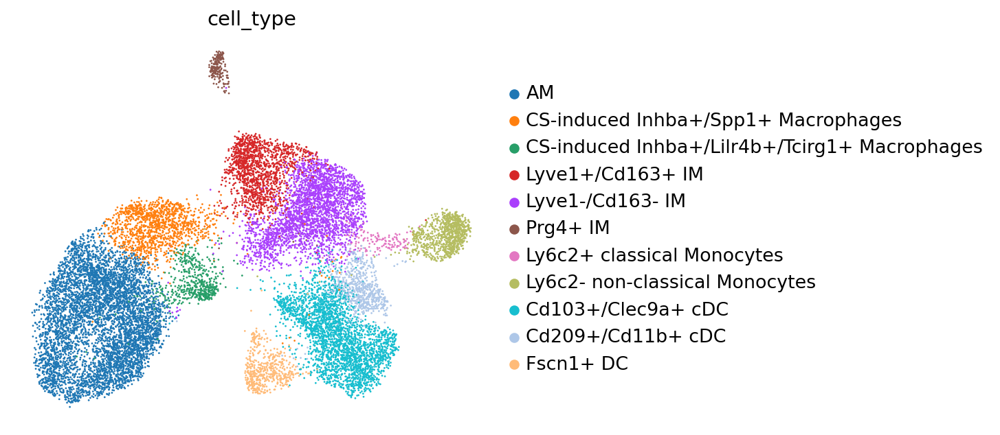

In [31]:
## change order of cell type labels
adata_MP.obs['cell_type'] = adata_MP.obs['cell_type'].cat.reorder_categories(['AM',
                                                                              'CS-induced Inhba+/Spp1+ Macrophages',
                                                                              'CS-induced Inhba+/Lilr4b+/Tcirg1+ Macrophages',
                                                                              'Lyve1+/Cd163+ IM', 'Lyve1-/Cd163- IM', 'Prg4+ IM',
                                                                              'Ly6c2+ classical Monocytes', 'Ly6c2- non-classical Monocytes',
                                                                              'Cd103+/Clec9a+ cDC', 'Cd209+/Cd11b+ cDC', 'Fscn1+ DC'
                                                                             ])
sc.pl.umap(adata_MP, color = "cell_type", ax = mysize(6, 5, 150), frameon = False)

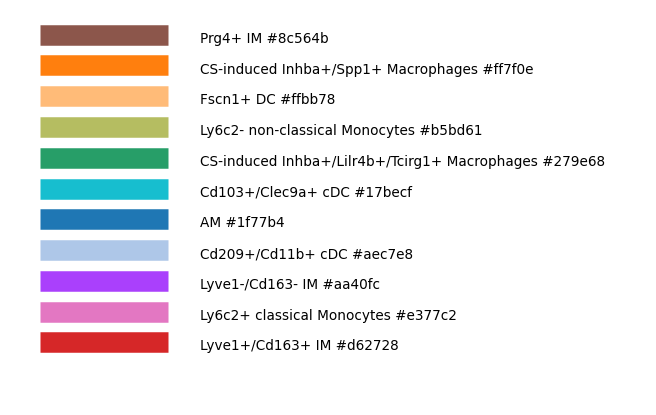

In [32]:
## change colors of cell type labels
group = "cell_type"
colors = dict(zip(adata_MP.obs.loc[:, group].cat.categories, adata_MP.uns["%s_colors" %group]))
codes.plot_colors(colors, ncols = 1, figsize = (8, 5))

In [33]:
## current colours - palette looks fin
## but some adjustments needed to avoid light green and dark green to be next to each other
colors

{'AM': '#1f77b4',
 'CS-induced Inhba+/Spp1+ Macrophages': '#ff7f0e',
 'CS-induced Inhba+/Lilr4b+/Tcirg1+ Macrophages': '#279e68',
 'Lyve1+/Cd163+ IM': '#d62728',
 'Lyve1-/Cd163- IM': '#aa40fc',
 'Prg4+ IM': '#8c564b',
 'Ly6c2+ classical Monocytes': '#e377c2',
 'Ly6c2- non-classical Monocytes': '#b5bd61',
 'Cd103+/Clec9a+ cDC': '#17becf',
 'Cd209+/Cd11b+ cDC': '#aec7e8',
 'Fscn1+ DC': '#ffbb78'}

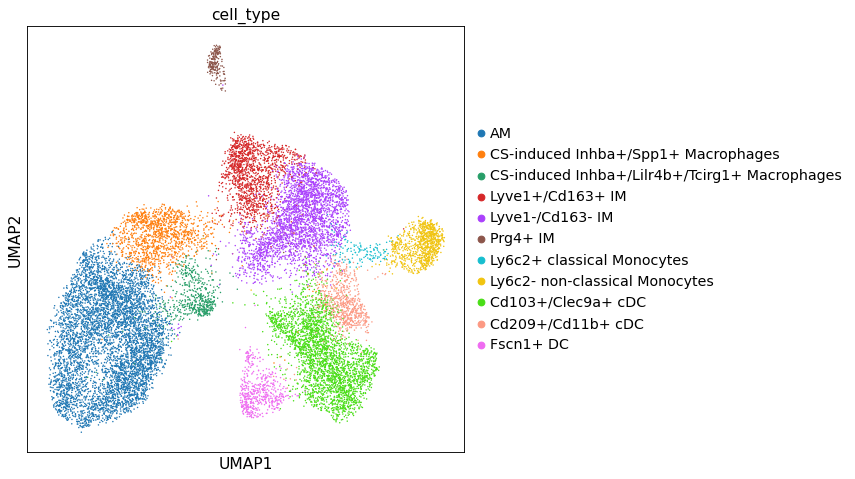

In [34]:
## reorder colours
celltype_colours = ['#1f77b4', #AM
                    '#ff7f0e', #Smoke-induced Inhba+/Spp1+ Macrophages
                    '#279e68', #Smoke-induced Inhba+/Lilr4b+/Tcirg1+ Macrophages
                    '#d62728', #Lyve1+/Cd163+ IM
                    '#aa40fc', #Lyve1-/Cd163- IM
                    '#8c564b', #Prg4+ IM
                    '#17becf', #Ly6c2- non-classical Monocytes
                    '#f1c40f', #Ly6c2+ classical Monocytes
                    '#49de16', #Cd209+/Cd11b+ cDC
                    '#fc9983', #Cd103+/Clec9a+ cDC
                    '#ef6bf1' #Fscn1+ DC
                    
                   ]
sc.pl.umap(adata_MP, color = "cell_type", palette = celltype_colours)

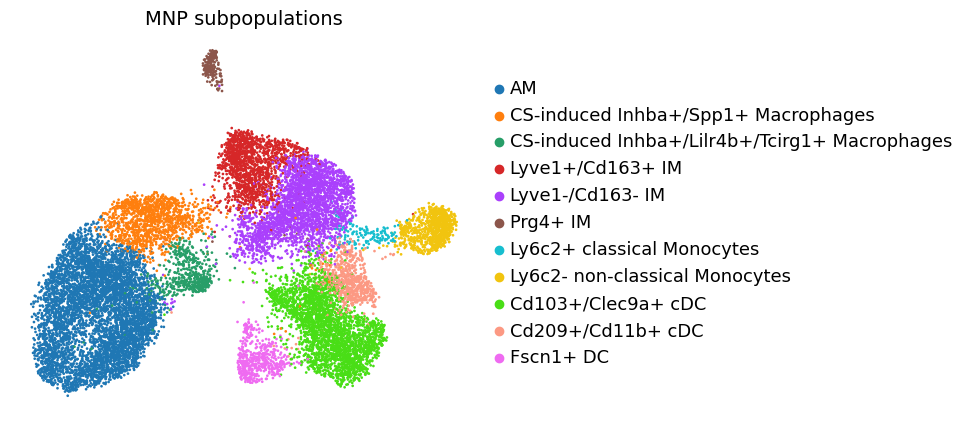

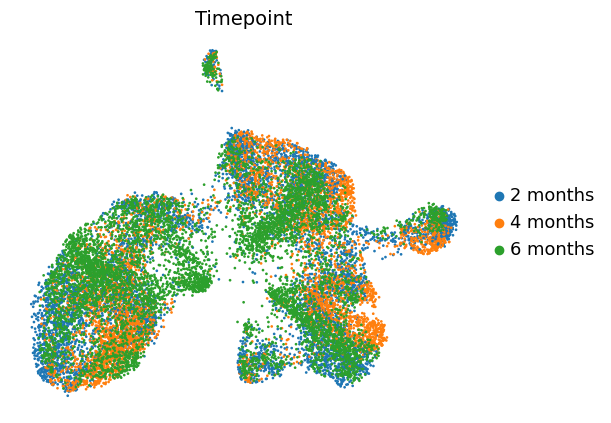

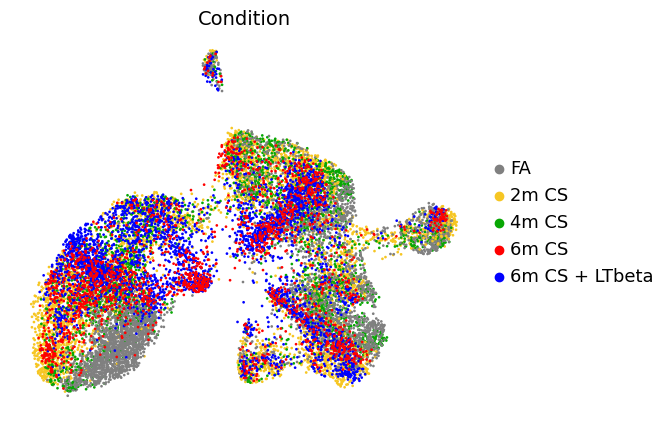

In [35]:
## save UMAP of MNPs for future use
sc.pl.umap(adata_MP, color = ['cell_type'], title = 'MNP subpopulations', frameon = False, 
           ax = mysize(6, 5, 100),  size = 15, save = '_MNPs_celltype.pdf')
sc.pl.umap(adata_MP, color = ['timepoint'], title = 'Timepoint', frameon = False, 
           ax = mysize(6, 5, 100),  size = 15, save = '_MNPs_timepoint.pdf')
sc.pl.umap(adata_MP, color = ['condition'], title = 'Condition', frameon = False, 
           ax = mysize(6, 5, 100),  size = 15, save = '_MNPs_condition.pdf')

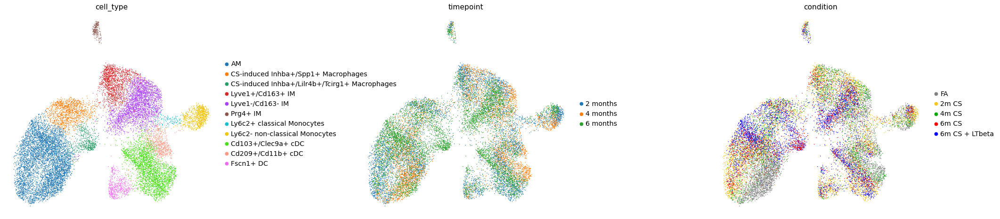

In [36]:
## save summary UMAP of MNPs
sc.pl.umap(adata_MP, color = ['cell_type', 'timepoint', 'condition'], ncols = 3, wspace = 0.5, frameon = False, save = '_MNPs_overview.pdf')

In [37]:
## save adata_MP object
adata_MP_path = '/mnt/platte_1/Projects/200217_SmokedMice_all/210218_Smoked_Mice_MNPs_refined_annotation_NIKLAS.h5ad'
adata_MP.write(adata_MP_path )

In [38]:
## transfer labels to full adata object
adata.obs["cell_type_refined"] = adata.obs["cell_type_nano"]
adata.obs["cell_type_refined"] = [adata_MP.obs.loc[c, "cell_type"] if c in adata_MP.obs_names else ctr
                                  for c, ctr in zip(adata.obs_names, adata.obs.cell_type_refined)]

In [39]:
## no. of cells before DBscan
adata

AnnData object with n_obs × n_vars = 68269 × 27780
    obs: 'air', 'condition', 'identifier', 'name', 'timepoint', 'n_counts', 'n_genes', 'percent.mito', 'QC_group', 'size_factors', 'S_score', 'G2M_score', 'phase', 'louvain_1', 'louvain', 'louvain_2', 'cell_type', 'cell_type_condition', 'louvain_3', 'cell_type_nano', 'meta_cell_type', 'cell_type_refined'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'n_counts'
    uns: 'cell_type_colors', 'cell_type_nano_colors', 'cell_type_refined_colors', 'condition_colors', 'dendrogram_louvain_2', 'louvain', 'louvain_1_colors', 'louvain_2_colors', 'louvain_3_colors', 'neighbors', 'pca', 'rank_genes_groups', 'timepoint_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [40]:
## subset cells removed by DBscan - which still do have old cell type labels
adata = adata[-adata.obs.cell_type_refined.isin(['CD103+/Clec9a+ cDC', 'CD209+/CD11b+ DC', 'Ly6c2- nc Monocytes'])].copy()

In [41]:
## no. of cells after DBscan
adata

AnnData object with n_obs × n_vars = 68256 × 27780
    obs: 'air', 'condition', 'identifier', 'name', 'timepoint', 'n_counts', 'n_genes', 'percent.mito', 'QC_group', 'size_factors', 'S_score', 'G2M_score', 'phase', 'louvain_1', 'louvain', 'louvain_2', 'cell_type', 'cell_type_condition', 'louvain_3', 'cell_type_nano', 'meta_cell_type', 'cell_type_refined'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'n_counts'
    uns: 'cell_type_colors', 'cell_type_nano_colors', 'cell_type_refined_colors', 'condition_colors', 'dendrogram_louvain_2', 'louvain', 'louvain_1_colors', 'louvain_2_colors', 'louvain_3_colors', 'neighbors', 'pca', 'rank_genes_groups', 'timepoint_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

... storing 'cell_type_refined' as categorical


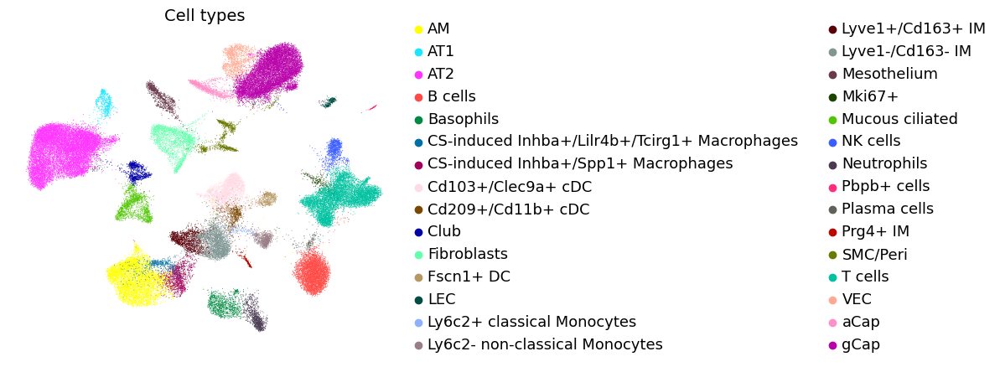

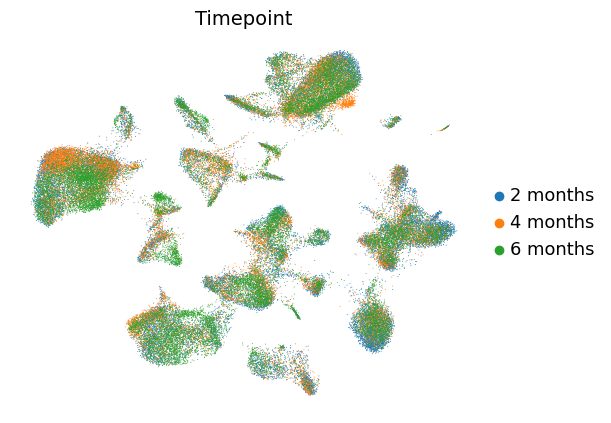

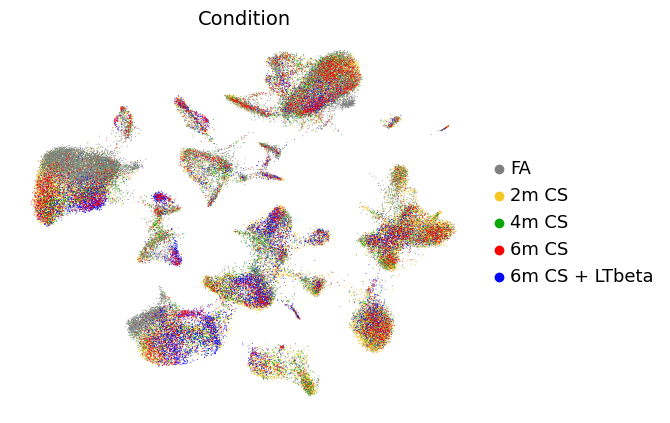

In [42]:
## save UMAP of ALL celltypes for future use
sc.pl.umap(adata, color = ['cell_type_refined'], title = 'Cell types', frameon = False, 
           ax = mysize(6, 5, 100), save = '_ALL_celltype.pdf')
sc.pl.umap(adata, color = ['timepoint'], title = 'Timepoint', frameon = False, 
           ax = mysize(6, 5, 100), save = '_ALL_timepoint.pdf')
sc.pl.umap(adata, color = ['condition'], title = 'Condition', frameon = False, 
           ax = mysize(6, 5, 100), save = '_ALL_condition.pdf')

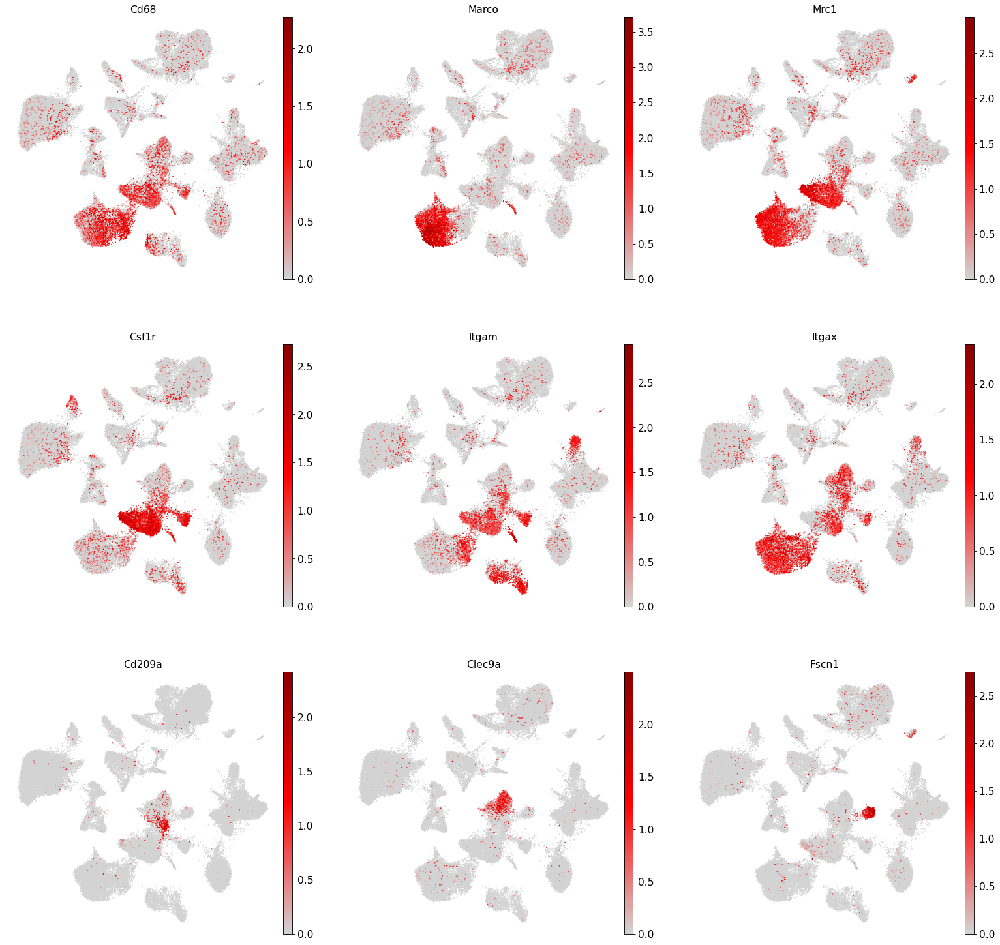

In [43]:
## save MNP marker feature plots for progress reports
sc.pl.umap(adata, color = ['Cd68', 'Marco', 'Mrc1', 'Csf1r', 'Itgam', 'Itgax', 'Cd209a','Clec9a', 'Fscn1'], ncols = 3, size = 10, 
           cmap = gray_red, frameon = False, save = '_MNP_markers.pdf')

In [44]:
## save adata object with new annotations
adata_refined_path = '/mnt/platte_1/Projects/200217_SmokedMice_all/200426_Smoked_Mice_allcells_noMixture_refined_annotation_NIKLAS.h5ad'
adata.write(adata_refined_path)